In [46]:
from matplotlib import pyplot as plt
%matplotlib inline
fname = "WSC 10cm WGS1984 - Cloud.ply"
xs, ys, zs = [ ], [ ], [ ]
fin = open(fname)
for l in fin:
    if l.strip() == "end_header":
        break


In [48]:
for l in fin:
    v = l.strip().split()
    if len(v) == 8:
        xs.append(float(v[0]))
        ys.append(float(v[1]))
        zs.append(float(v[2]))
        

In [49]:
len(xs)

1413194

In [50]:
import numpy
b = numpy.array([xs, ys, zs]).transpose()

In [51]:
c = b[numpy.flip(b[:,0].argsort())].transpose()

In [53]:
c = b[numpy.flip(b[:,1].argsort())].transpose()

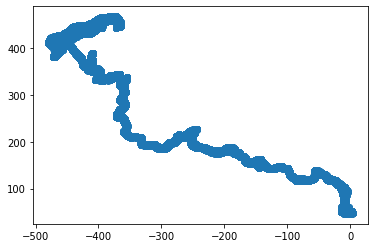

In [52]:
plt.scatter(xs, ys)

In [68]:
plt.scatter?

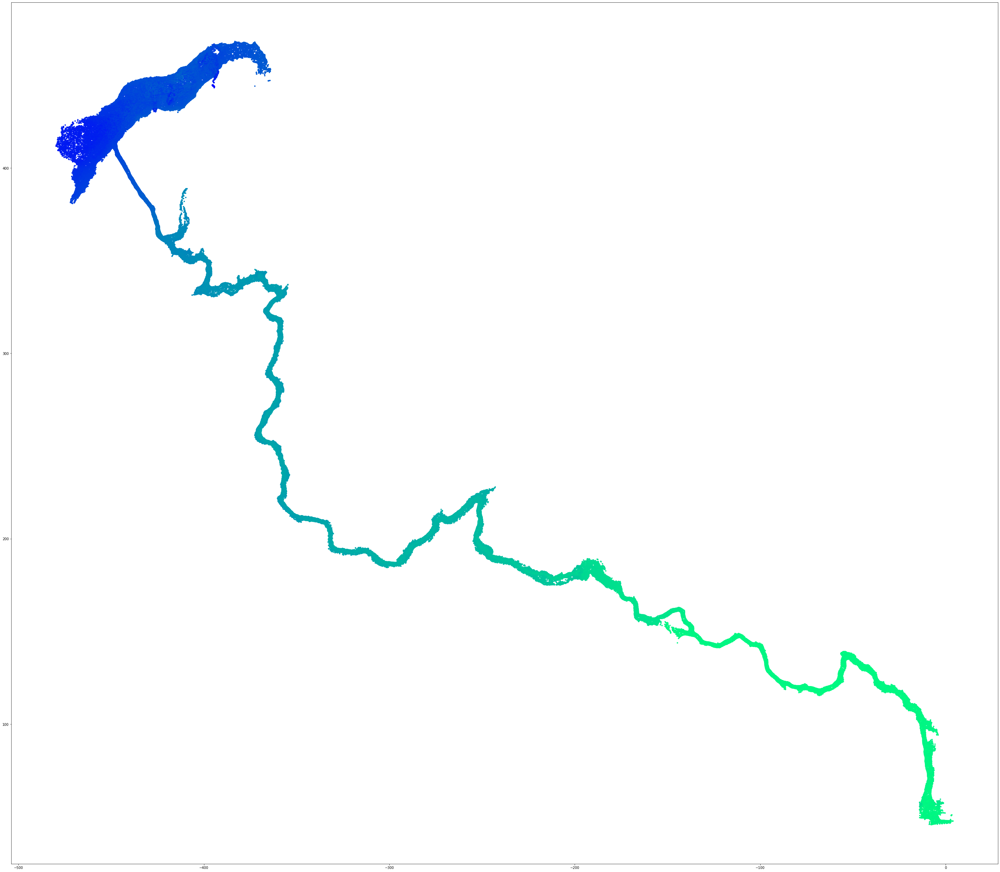

In [72]:
n = 900000
plt.figure(figsize=(52,52))
plt.gca().set_aspect('equal')
d = c[:,::10]
plt.scatter(d[0], d[1], marker=".", c=d[2], cmap="winter_r")

In [ ]:
Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'winter', 'winter_r

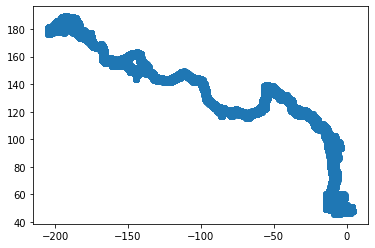

In [40]:
n = 300000
plt.scatter(c[0][:n], c[1][:n])

In [45]:
fout = open("smallcloud.csvn", "w")
for v in c.transpose()[:n]:
    fout.write("%f,%f,%f\n" % tuple(v))
fout.close()

In [3]:
from plyfile import PlyData, PlyElement
plydata = PlyData.read('36 Winstanley Road.ply')


In [4]:
plydata

PlyData((PlyElement('vertex', (PlyProperty('x', 'float'), PlyProperty('y', 'float'), PlyProperty('z', 'float'), PlyProperty('diffuse_red', 'uchar'), PlyProperty('diffuse_green', 'uchar'), PlyProperty('diffuse_blue', 'uchar')), count=3351371, comments=[]),), text=False, byte_order='<', comments=[], obj_info=[])

In [19]:
e = plydata.elements[0]
#plt.figure(figsize=(52,52))
#plt.gca().set_aspect('equal')
#d = c[:,::10]
#plt.scatter(d[0], d[1], marker=".", c=d[2], cmap="winter_r")

In [23]:
e.data[0]

(2.9456902, -1.5032952, 2.4868119, 122, 121, 121)

In [25]:
X = [r[0]  for r in e.data]
Y = [r[1]  for r in e.data]

In [38]:
Z = [r[2]  for r in e.data]

In [35]:
c = [(r[3]/255.0,r[4]/255.0,r[5]/255.0)  for r in e.data]
#plt.plot(c[::10])

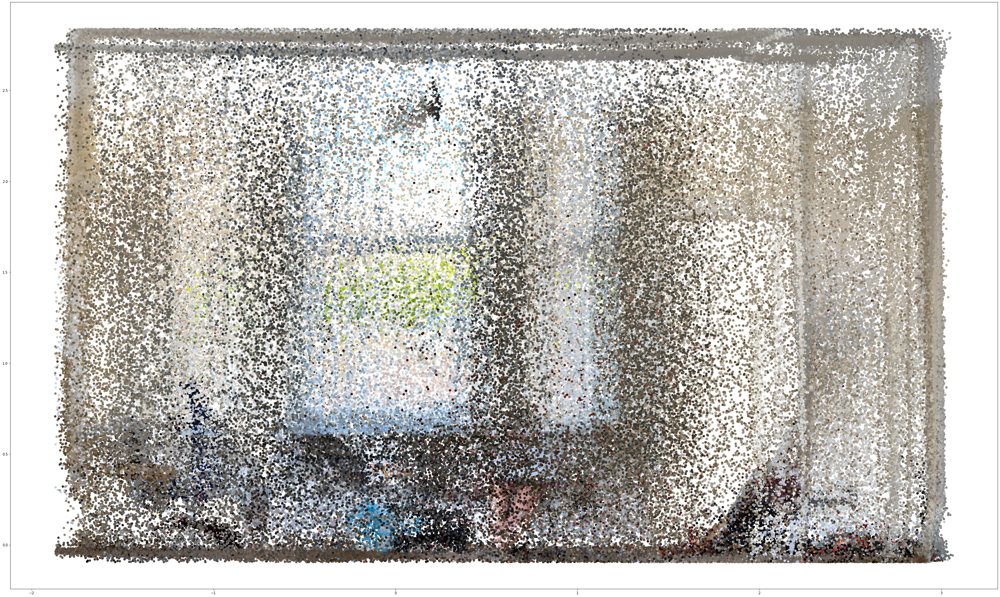

In [41]:
from matplotlib import pyplot as plt
%matplotlib inline

plt.figure(figsize=(52,52))
plt.gca().set_aspect('equal')
plt.scatter(X[::10], Z[::10], c=c[::10])

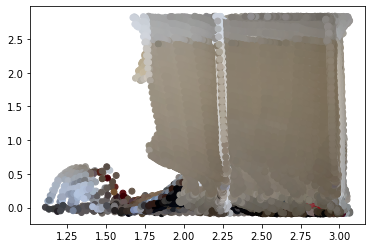

In [42]:
plt.scatter(X[:300000], Z[:300000], c=c[:300000])

In [44]:
len(e.data[::10])


335138

In [45]:
fout = open("alexroom.csvn", "w")
for v in e.data[::10]:
    fout.write("%f,%f,%f,%d,%d,%d\n" % tuple(v))
fout.close()